<a href="https://colab.research.google.com/github/FabihaSaiyara/AMR_KAP_Reproduce/blob/main/day_02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<a href="https://colab.research.google.com/github/mirsazzathossain/compbio-bracu/blob/main/day_02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Day 02: Interdisciplinary Computational Biology workshop 2025**

### **Problem Statement:**

In this hands-on workshop, you'll explore how machine learning can be applied to computational biology. You'll work with Gene Ontology (GO) terms that describe biological functions and processes. The task is to perform binary classification to predict the presence or absence of specific biological functions in a dataset.

- You are provided with a list of GO terms in [this google sheet](https://docs.google.com/spreadsheets/d/1Sc_1Sfi4pKxQ6VGf4j7i7wp0u4kzREzyHb0qwj6AVbM/edit?usp=sharing).
- Open the spreadsheet and select the GO terms that your group will work on. Before selecting, explore each term in the [QuickGO database](https://www.ebi.ac.uk/QuickGO/term/GO:0000001) to understand the biological context of the term.
- You can use ChatGPT to help you understand the terms.


In this notebook, you'll learn how to retrieve a dataset related to your selected GO terms and apply machine learning techniques to predict the presence or absence of these biological functions.


### **Setup codebase**

We will be using a Python package called `ProFAB` for to retrieve the GO dataset. Run the following code to get the package installed.

In [4]:
import os
if not os.path.exists('profab'):
    !git clone https://github.com/kansil/ProFAB.git
    !cp -r ProFAB/profab .
    !rm -rf ProFAB


Cloning into 'ProFAB'...
remote: Enumerating objects: 2638, done.
remote: Counting objects: 100% (386/386), done.
remote: Compressing objects: 100% (224/224), done.
remote: Total 2638 (delta 237), reused 266 (delta 162), pack-reused 2252 (from 1)
Receiving objects: 100% (2638/2638), 208.81 MiB | 18.61 MiB/s, done.
Resolving deltas: 100% (1536/1536), done.
Updating files: 100% (198/198), done.


### **Import Libraries**

To get started, we need to import a set of essential libraries that will help us perform various tasks:

- **`numpy`**: For efficient numerical computations.
- **`pandas`**: To handle and manipulate structured data.
- **`matplotlib` and `seaborn`**: For creating insightful visualizations.
- **`sklearn`**: To build and evaluate machine learning models.

In Python, it's best practice to import all necessary libraries at the beginning of your script or notebook.  Do these later one by one when you need them in the notebook.

In [20]:
# TODO: Import the necessary libraries
from profab.import_dataset import GOID
import pandas as pd
pd.set_option("display.max_columns", None)
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report, roc_curve, roc_auc_score

### **Load Data**

The `ProFAB` package provides the `GOID()` function, which allows you to retrieve datasets related to your selected Gene Ontology (GO) terms.

**Parameters of the `GOID()` Function:**

- **`ratio`**: Specifies the proportions for splitting the data into training, testing, and validation sets.
  - If `ratio` is a single float (e.g., `0.2`), it defines the test set size, with the remaining data allocated to training.
  - If `ratio` is a list of two floats (e.g., `[0.2, 0.1]`), it defines the test and validation set sizes, with the remaining data allocated to training.

- **`protein_feature`**: Determines the numerical feature representation of proteins derived from their sequences. Options include:
  - `'paac'`: Pseudo Amino Acid Composition (50 dimensions)
  - `'aac'`: Amino Acid Composition (20 dimensions)
  - `'gaac'`: Grouped Amino Acid Composition (5 dimensions)
  - `'ctdt'`: CTD Translation (39 dimensions)
  - `'socnumber'`: Quasi-Sequence-Order Coupling Number (60 dimensions)
  - `'ctriad'`: Conjoint Triad (343 dimensions)
  - `'kpssm'`: k-Separated-Bigrams POSSUM Vector (400 dimensions)

  *Default: `'paac'`*

- **`pre_determined`**: Indicates whether the data has been pre-split into training and testing sets.
  - `False`: Data will be split according to the specified `ratio`.
  - `True`: Pre-split data will be used.

- **`set_type`**: Defines the method for splitting the data.
  - `'random'`: Random splitting.
  - `'similarity'`: Splitting based on protein similarity.
  - `'temporal'`: Splitting based on the temporal aspect of data collection.

    *Default: `'random'`*

Use the `GOID()` function to initialize a data module and save it to a variable.


**Retrieving Data for a Specific GO Term:**

To retrieve data for a specific GO term, use the `get_data()` function. The function takes the following parameters:

- **`data_name`**: The name of the GO term you selected. e.g., `'GO_0000001'`.


**Purpose of Training and Testing Sets:**

- **Training Set (`X_train`, `y_train`)**: Used to train the machine learning model, allowing it to learn the patterns and relationships within the data.
- **Testing Set (`X_test`, `y_test`)**: Used to evaluate the model's performance on unseen data, providing an estimate of how well the model generalizes to new, unseen examples.

Looking a bit complex? Don't worry! Just run the code below with your selected GO term, the data will be loaded and you can start exploring it.


In [6]:
data_model = GOID(ratio = 0.2, protein_feature = 'aac', pre_determined = False, set_type = 'random')
X_train,X_test,y_train,y_test = data_model.get_data(data_name = 'GO_0022618')

No local dataset for GO_0022618 is available. Downloading from server ...


100%|██████████| 15.4M/15.4M [00:02<00:00, 7.10MiB/s]


### **Explore Data**

Now, we got the data loaded. Let's explore the data by looking at the shape of the data, the first few rows of the data. `FroFAB` package provides data as a list, we will convert the data into a pandas DataFrame for better visualization.

- Preview the first few rows of the data using the `.head()` method.
- Use `.info()` method to get the information about the data.
- Use `.describe()` method to get the summary statistics of the data.



In [9]:
data = pd.DataFrame(X_train)
data['label'] = y_train

# TODO: Display the first 5 rows of the dataset
data.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,label
0,0.094812,0.019678,0.041145,0.044723,0.039356,0.073345,0.014311,0.085868,0.037567,0.119857,0.033989,0.030411,0.050089,0.033989,0.035778,0.059034,0.066190,0.094812,0.005367,0.019678,0
1,0.144118,0.000000,0.038235,0.117647,0.011765,0.061765,0.008824,0.073529,0.076471,0.120588,0.020588,0.032353,0.055882,0.038235,0.026471,0.026471,0.038235,0.073529,0.002941,0.032353,1
2,0.078261,0.008696,0.052174,0.078261,0.034783,0.043478,0.017391,0.043478,0.113043,0.104348,0.034783,0.060870,0.026087,0.026087,0.078261,0.069565,0.017391,0.095652,0.008696,0.008696,1
3,0.074236,0.010917,0.048035,0.096070,0.017467,0.074236,0.019651,0.080786,0.080786,0.100437,0.028384,0.021834,0.041485,0.039301,0.043668,0.056769,0.054585,0.087336,0.000000,0.024017,1
4,0.061306,0.046178,0.047771,0.069268,0.027070,0.079618,0.026274,0.039013,0.033439,0.108280,0.017516,0.032643,0.082803,0.042994,0.060510,0.065287,0.053344,0.064490,0.012739,0.029459,0


In [11]:
# TODO: Display the basic information about the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3190 entries, 0 to 3189
Data columns (total 21 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       3190 non-null   float64
 1   1       3190 non-null   float64
 2   2       3190 non-null   float64
 3   3       3190 non-null   float64
 4   4       3190 non-null   float64
 5   5       3190 non-null   float64
 6   6       3190 non-null   float64
 7   7       3190 non-null   float64
 8   8       3190 non-null   float64
 9   9       3190 non-null   float64
 10  10      3190 non-null   float64
 11  11      3190 non-null   float64
 12  12      3190 non-null   float64
 13  13      3190 non-null   float64
 14  14      3190 non-null   float64
 15  15      3190 non-null   float64
 16  16      3190 non-null   float64
 17  17      3190 non-null   float64
 18  18      3190 non-null   float64
 19  19      3190 non-null   float64
 20  label   3190 non-null   int64  
dtypes: float64(20), int64(1)
memory usage

In [12]:
# TODO: Display some basic statistics of the dataset
data.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,label
count,3190.000000,3190.000000,3190.000000,3190.000000,3190.000000,3190.000000,3190.000000,3190.000000,3190.000000,3190.000000,3190.000000,3190.000000,3190.000000,3190.000000,3190.000000,3190.000000,3190.000000,3190.000000,3190.000000,3190.000000,3190.000000
mean,0.079602,0.014147,0.051110,0.066566,0.038311,0.070716,0.023177,0.053787,0.071286,0.088537,0.025328,0.038478,0.051607,0.037875,0.062721,0.065120,0.053145,0.069575,0.010889,0.028021,0.502508
std,0.030940,0.013330,0.019146,0.027116,0.015328,0.026157,0.012881,0.021907,0.036155,0.027404,0.013236,0.018442,0.027006,0.017469,0.031117,0.025265,0.016591,0.021343,0.008502,0.013303,0.500072
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.057825,0.005980,0.038462,0.048444,0.027405,0.053153,0.014583,0.038765,0.046981,0.070977,0.016922,0.026829,0.036828,0.026554,0.042254,0.048276,0.042553,0.055053,0.004932,0.019355,0.000000
50%,0.075638,0.012084,0.050986,0.064299,0.037037,0.069483,0.021489,0.052763,0.066667,0.088542,0.023199,0.037037,0.047904,0.036071,0.056604,0.061856,0.052696,0.067991,0.009399,0.027149,1.000000
75%,0.098592,0.019308,0.062778,0.080346,0.047766,0.084848,0.029961,0.066667,0.088889,0.105762,0.031133,0.047902,0.060837,0.047284,0.076456,0.079076,0.062676,0.083333,0.015459,0.036024,1.000000
max,0.218391,0.149660,0.175000,0.213636,0.102362,0.231788,0.127325,0.161616,0.242857,0.221719,0.180328,0.264655,0.300926,0.235632,0.333333,0.407407,0.149123,0.157143,0.069930,0.104762,1.000000


### **Data Visualization**

Visualizing data is a crucial step in the data analysis process. It helps you understand the data distribution, relationships between features, and more. Use the `pairplot()` function from the `seaborn` library to create a pairplot of the data. The pairplot shows the relationship between different features in the dataset.

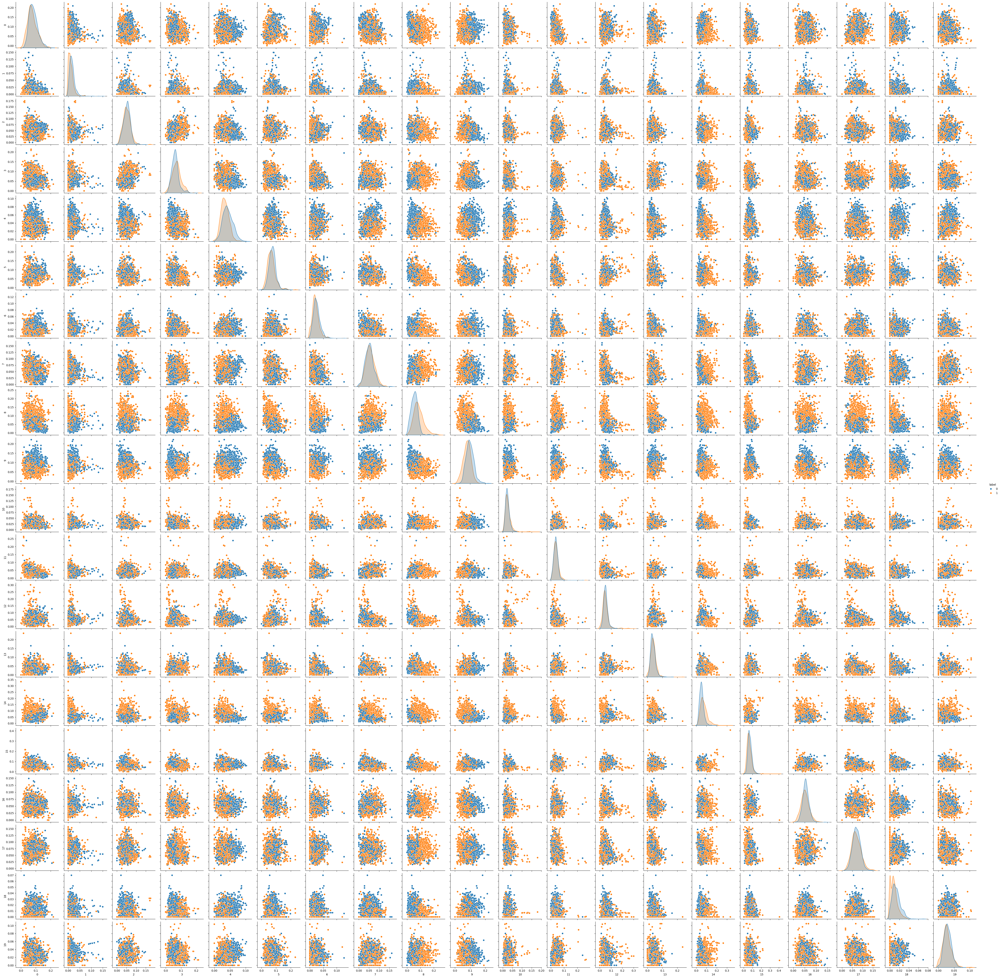

In [23]:
# TODO: Wtire code to plot a pairplot of the dataset
sns.pairplot(data, hue='label')
plt.show()

### **Feature Selection**

Feature selection is the process of selecting a subset of relevant features for use in model construction. It helps to improve the model's performance by reducing overfitting and increasing the model's interpretability. Use correlation matrix to identify the features that are highly correlated with the target variable.

 **Correlation Matrix**:  
   A correlation matrix helps identify the relationships between features. Correlation values range from -1 to 1:

   - A value close to **1** indicates a strong positive correlation.
   - A value close to **-1** indicates a strong negative correlation.
   - A value close to **0** indicates weak or no correlation.

   Use `df.corr()` to calculate the correlation matrix and `sns.heatmap()` to visualize it. Remove highly correlated features to reduce multicollinearity.

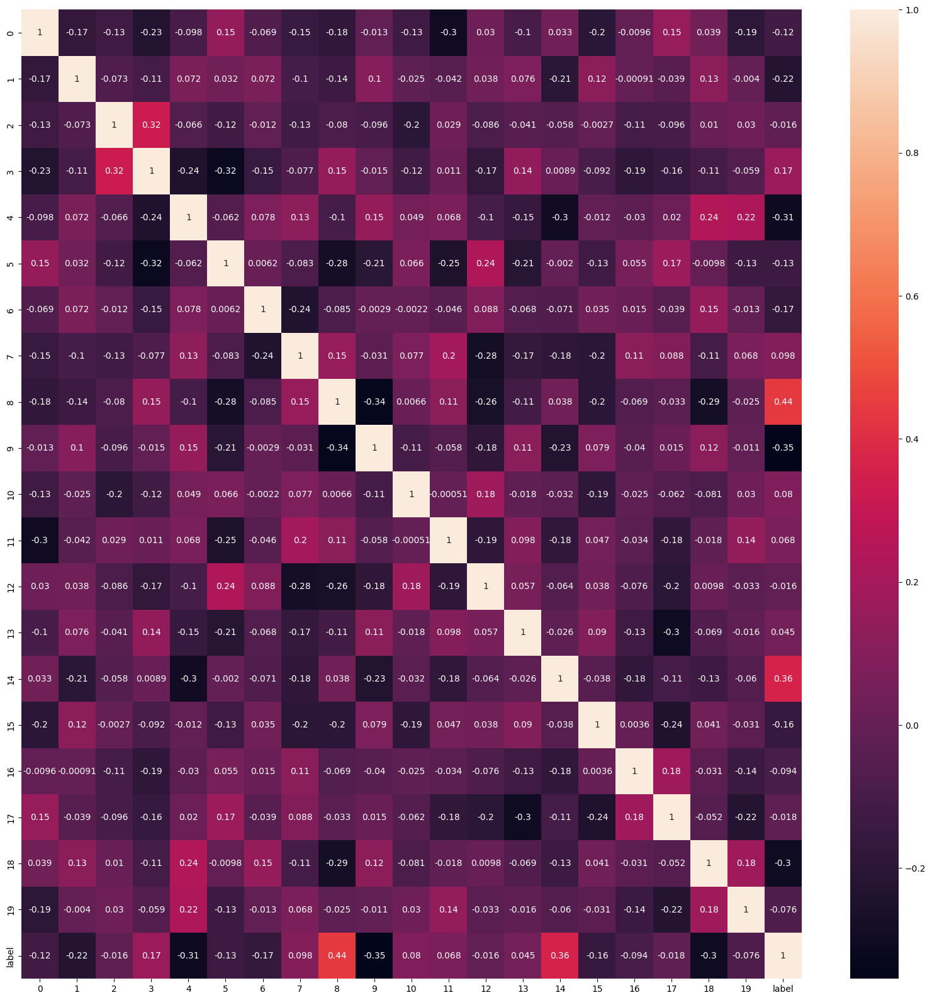

In [31]:
# TODO:
# Calculate the correlation matrix of the dataset using the corr() method
# Plot the correlation matrix using a heatmap
plt.figure(figsize=(20,20))
corr = data.corr()
sns.heatmap(corr, annot = True)
plt.show()



### **Standardizing the Data**

Standardization is important to scale the features so that they have a mean of 0 and a standard deviation of 1. This ensures that each feature contributes equally to the model, especially for algorithms sensitive to feature scales.

**Action**:

1. Use `StandardScaler` from `sklearn.preprocessing` to standardize the features.
2. Apply the scaler to all features, excluding the target variable.
3. Replace the original features with the standardized values in the DataFrame.

In [39]:
# TODO:
# Instantiate a StandardScaler object
# Fit the scaler object on the training data
# Transform the training and testing data using the scaler object
from sklearn.preprocessing import StandardScaler
scale = StandardScaler()
X_train = scale.fit_transform(X_train)
X_test = scale.transform(X_test)

### **Model Building**

Now that the data is preprocessed and ready, you can proceed with building a machine learning model.

#### **Model Selection**

For this task, you can choose any classification algorithm to build the model. Here are a few popular algorithms you can consider:

**Traditional Classifiers:**

- `LogisticRegression`
- `KNeighborsClassifier`
- `SVC` (Support Vector Classifier)
- `DecisionTreeClassifier`
- `RandomForestClassifier`
- `GradientBoostingClassifier`
- `AdaBoostClassifier`
- `XGBClassifier` (if using `XGBoost`)

**Deep Neural Network Classifier:**

- `MLPClassifier` (Multi-layer Perceptron from `sklearn.neural_network`)

Initialize the chosen model using appropriate parameters.

In [40]:
# TODO: Instantiate a Classifier object of your choice
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()

#### **Model Training**

Train the initialized model on the training data using the `fit()` function.

In [41]:
# TODO: Fit the classifier object on the training data
model.fit(X_train, y_train)

LogisticRegression()

#### **Predictions**

Use the `predict()` function to predict the target values on the test set, and save them as `y_pred`.

In [42]:
# TODO: Predict the labels of the testing data
y_pred = model.predict(X_test)

#### **Model Evaluation**

Evaluate the model's performance using various metrics such as accuracy, precision, recall, F1-score, and confusion matrix.

##### **Confusion Matrix**

A confusion matrix is a table that is often used to describe the performance of a classification model on a set of data for which the true values are known. It helps visualize the performance of an algorithm.

Use the `confusion_matrix()` function from `sklearn.metrics` to calculate the confusion matrix. Save the confusion matrix in a variable and visualize it using `sns.heatmap()`.

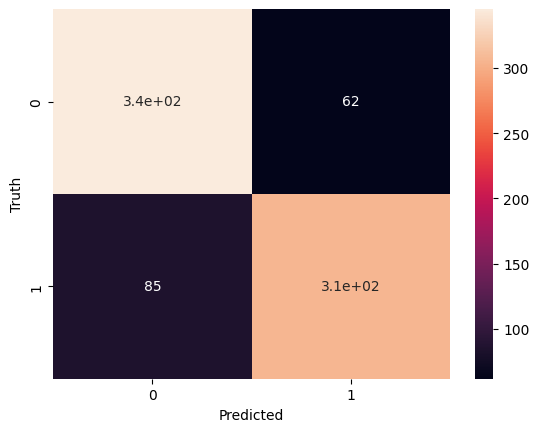

In [46]:
# TODO:
# Calculate confusion matrix using of the predicted labels and the actual labels
# Plot the confusion matrix using a heatmap
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')
plt.show()

##### **Classification Metrics**

There are several metrics to evaluate the performance of a classification model. Here are a few common metrics:

- **Accuracy**: The proportion of correct predictions to the total number of predictions.
$$Accuracy = \frac{TP + TN}{TP + TN + FP + FN}$$
- **Precision**: The proportion of true positive predictions to the total positive predictions.
$$Precision = \frac{TP}{TP + FP}$$
- **Recall**: The proportion of true positive predictions to the total actual positive instances.
$$Recall = \frac{TP}{TP + FN}$$
- **F1-Score**: The harmonic mean of precision and recall.
$$F1-Score = 2 \times \frac{Precision \times Recall}{Precision + Recall}$$

Use the `classification_report()` function from `sklearn.metrics` to calculate these metrics and print the classification report.

In [47]:
# TODO: Use the classification_report method to calculate the precision, recall and f1-score of the model and print it
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.80      0.85      0.82       407
           1       0.83      0.78      0.81       391

    accuracy                           0.82       798
   macro avg       0.82      0.82      0.82       798
weighted avg       0.82      0.82      0.82       798



##### **ROC Curve**

The Receiver Operating Characteristic (ROC) curve is a graphical representation of the true positive rate against the false positive rate. It shows the trade-off between sensitivity and specificity. The Area Under the Curve (AUC) is a metric that quantifies the overall performance of the model.

Use the `roc_curve()` function from `sklearn.metrics` to calculate the ROC curve and the `auc()` function to calculate the AUC. Plot the ROC curve using `matplotlib`.
For today's workshop, you just run the code below and get the results.

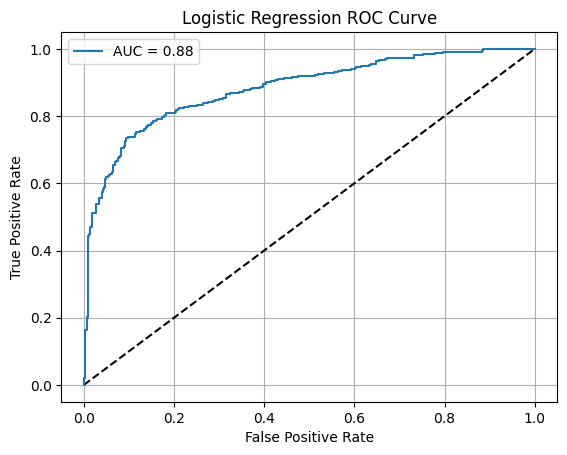

In [50]:
from sklearn.metrics import roc_curve, roc_auc_score
y_pred_prob = model.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
auc = roc_auc_score(y_test, y_pred_prob)

plt.plot([0, 1], [0, 1], "k--")
plt.plot(fpr, tpr, label=f"AUC = {auc:.2f}")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Logistic Regression ROC Curve")
plt.legend()
plt.grid()
plt.show()

### **Additional Tasks**

- **Use Different Features**: While loading the data, we chosed `protein_feature` as `aac`. Now, for yur GO term, this feature may not be the best one. You task is to try with different features and see if the model performance improves.
- **Choose Different Model**: You can try with different models and see if the model performance improves.

In [ ]:
# Write your code here
##For Feature: 'paac': Pseudo Amino Acid Composition (50 dimensions)


